In [1]:
import shapely as shp
import pandas as pd, numpy as np, matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
import geopandas as gpd
import seaborn as sns
%matplotlib inline

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [2]:
fname = 'Data/tracks_listing_households.geojson'
tracks = gpd.GeoDataFrame.from_file(fname)
print tracks.crs

{'init': u'epsg:4326'}


In [3]:
totalshape = tracks.geometry[1]
for shape in tracks.geometry:
    totalshape = totalshape.union(shape)

In [4]:
totalshape

totalshape = tracks.geometry[1]
def theunion(shape):
    totalshape = totalshape.union(shape)
    return totalshape
    
x = tracks.geometry.map

In [18]:
un = totalshape.envelope.symmetric_difference(totalshape)
un

In [2]:
gdf = gpd.GeoDataFrame.from_file('Data/NYClisting.geojson')
gdf.head()
df = gdf[['latitude','longitude']]
coords = gdf.as_matrix(columns=['latitude','longitude'])

In [22]:
import descartes 

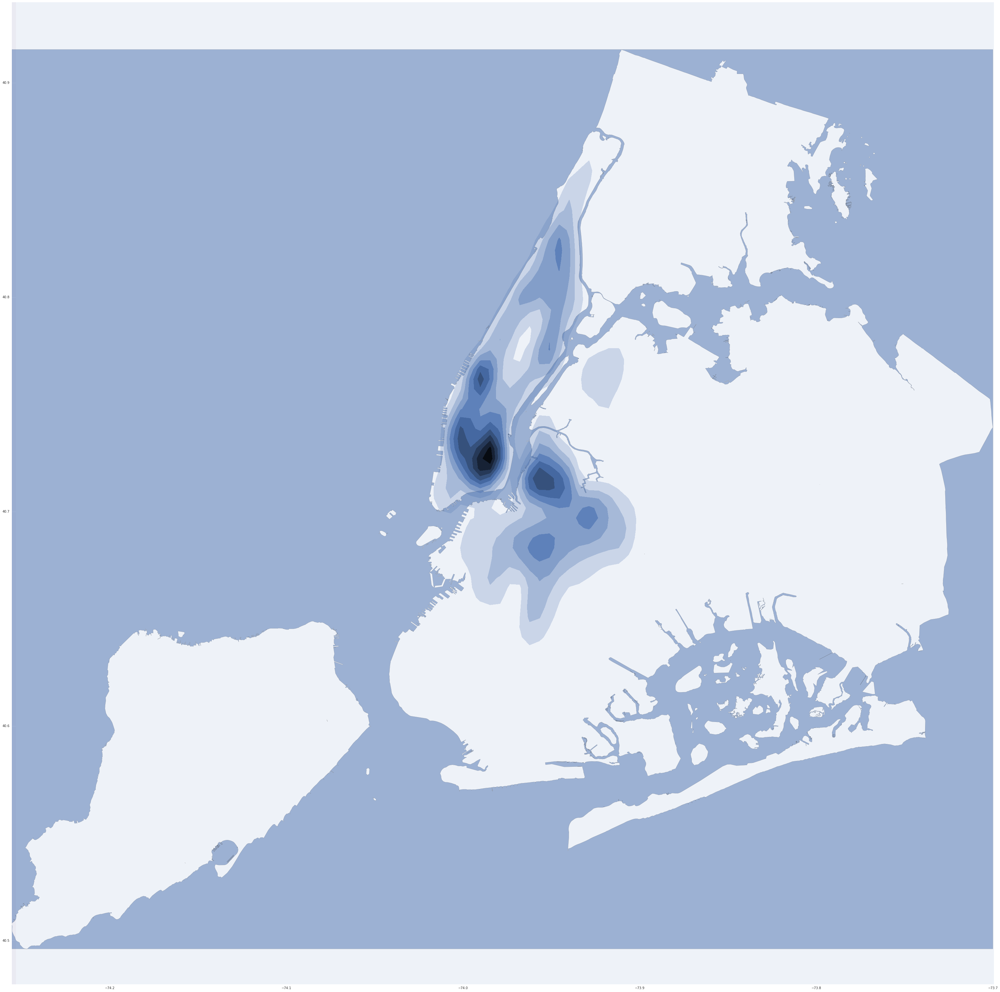

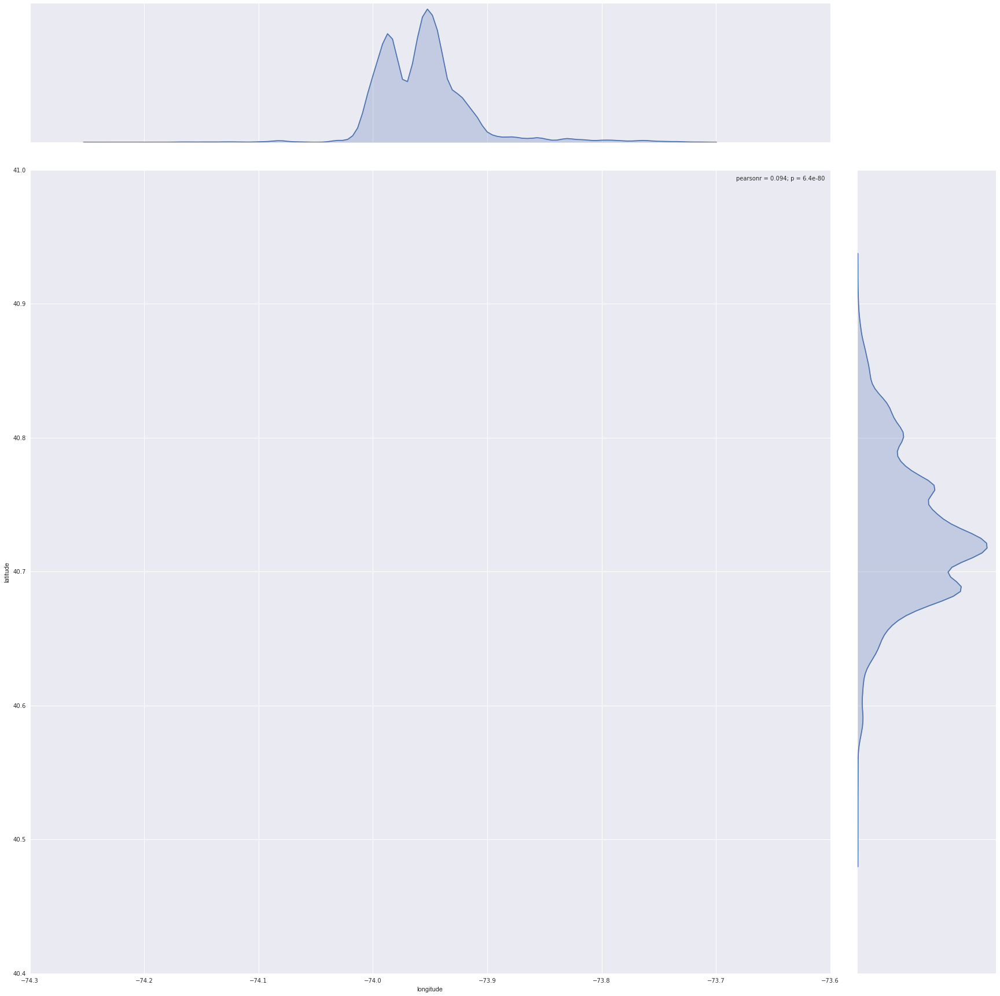

In [42]:
f, ax = plt.subplots(figsize=(55,55))
for polygon in un:

    patch = PolygonPatch(polygon, alpha=0.5, zorder=2)
    ax.add_patch(patch)
sns.jointplot(x="longitude", y="latitude", data=gdf, kind="kde", size=24,ax=ax)

In [49]:
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap    
mycolor1 = ListedColormap('k')
mycolor2 = ListedColormap('w')


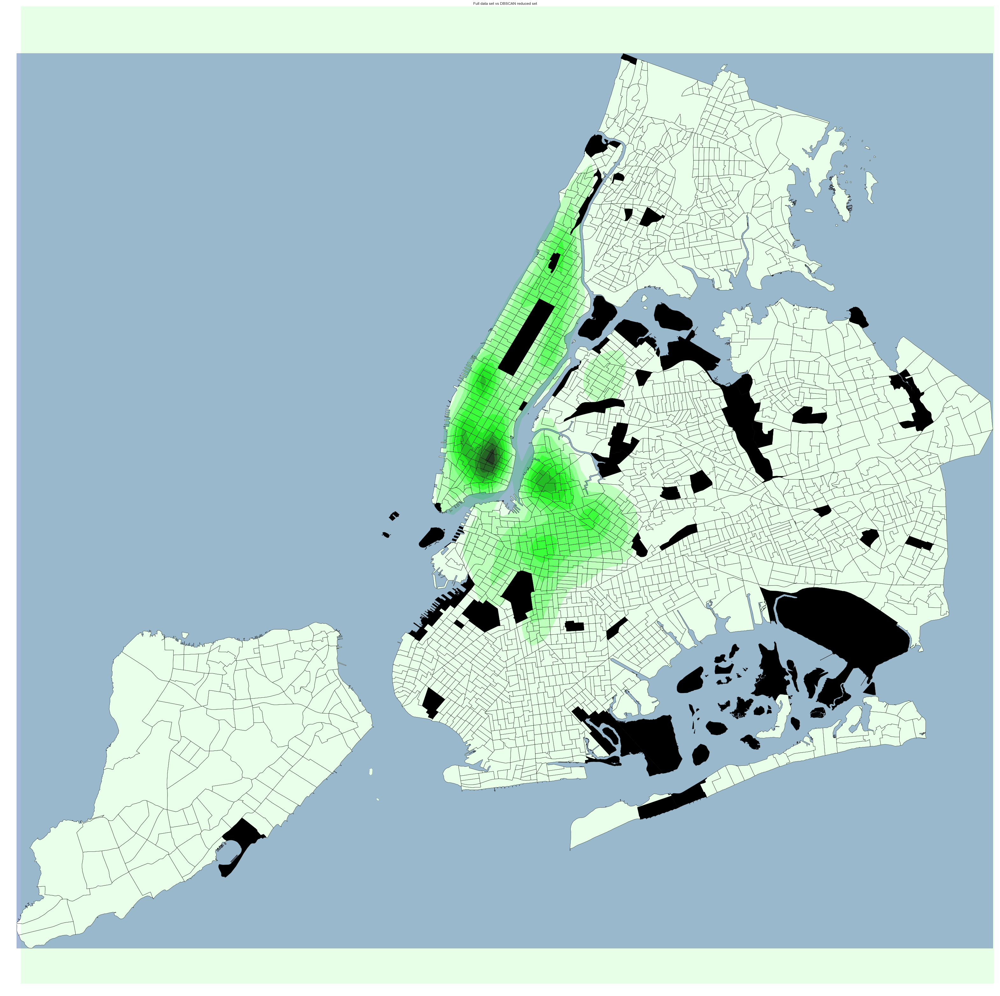

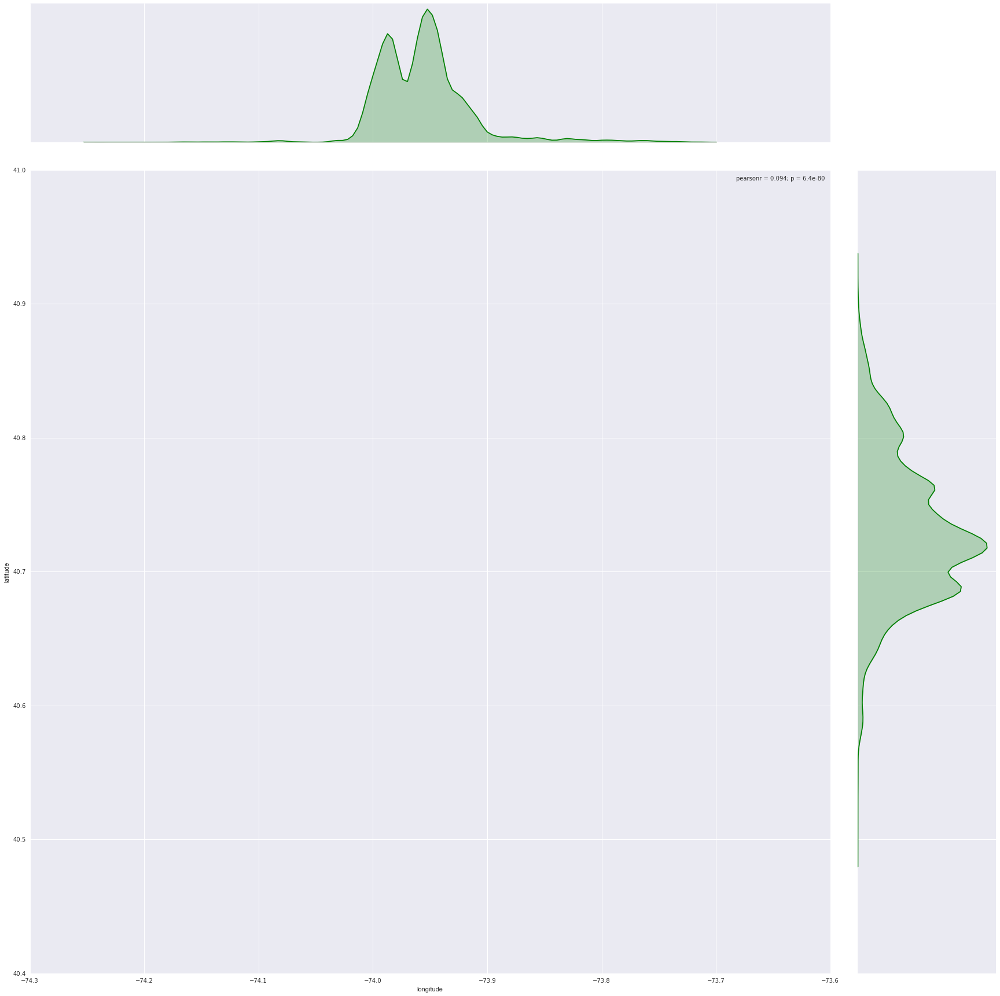

In [56]:
f, ax = plt.subplots(figsize=(55,55))
plt.axis('off')
for polygon in un:

    patch = PolygonPatch(polygon, alpha=0.5, zorder=2)
    ax.add_patch(patch)
tracks[tracks['HD01_VD01']==0].plot(c = 'k', linewidth = .5, ax = ax, cmap=mycolor1, alpha=1)
tracks[tracks['HD01_VD01']>0].plot(c = 'k', linewidth = .5, ax = ax,  cmap = mycolor2, alpha=.15)
sns.jointplot(x="longitude", y="latitude", data=gdf, kind="kde", size=24,ax=ax, color="g")
ax.set_title('Full data set vs DBSCAN reduced set')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
#ax.legend([rs_scatter], ['Full set', 'Reduced set'], loc='upper right')
plt.show()


In [85]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Generate fake data
x = np.random.normal(size=1000)
y = x * 3 + np.random.normal(size=1000)

y = gdf['latitude'].as_matrix()
x = gdf['longitude'].as_matrix()


In [86]:
# Calculate the point density
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)

In [87]:
# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]

In [98]:
len((z))

40586

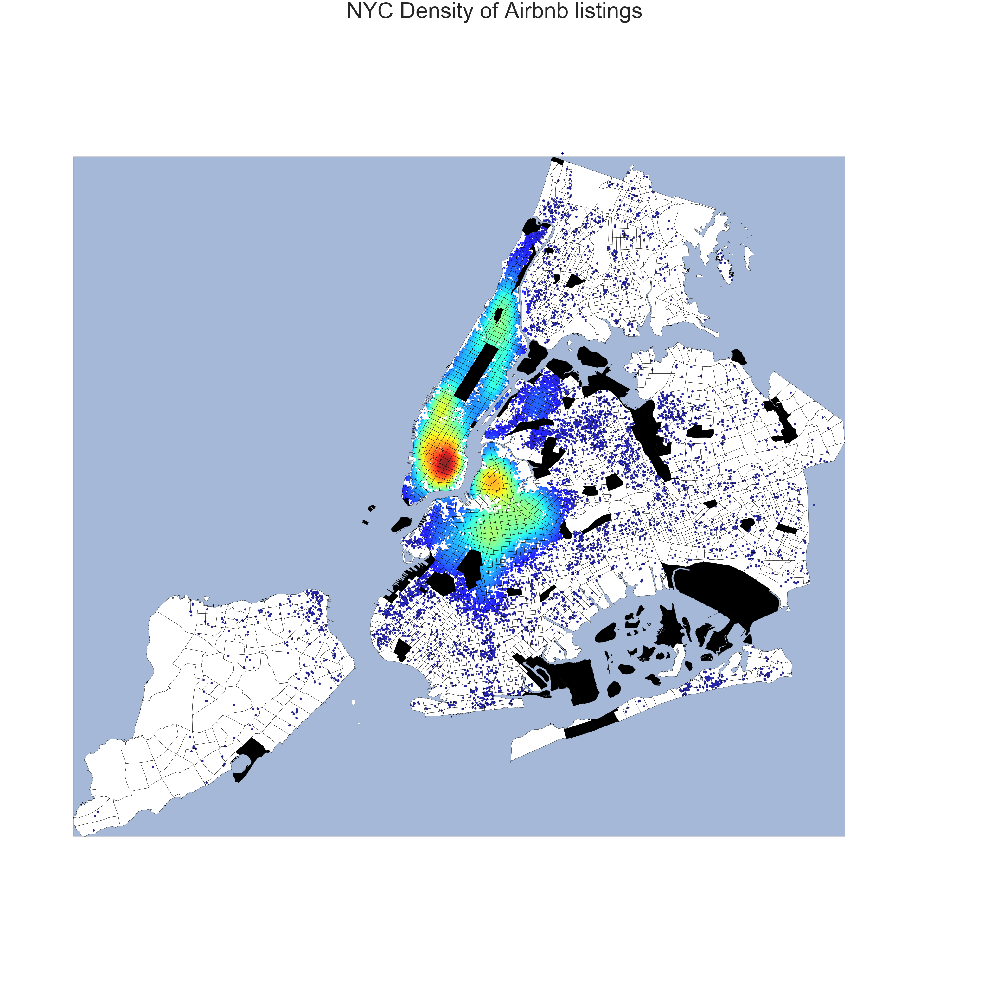

In [94]:
f, ax = plt.subplots(figsize=(55,55))
for polygon in un:
    patch = PolygonPatch(polygon, alpha=0.5, zorder=2)
    ax.add_patch(patch)
    
tracks[tracks['HD01_VD01']==0].plot(c = 'k', linewidth = .5, ax = ax, cmap=mycolor1, alpha=1)
tracks[tracks['HD01_VD01']>0].plot(c = 'k', linewidth = .5, ax = ax,  cmap = mycolor2, alpha=.15)
ax.scatter(x, y, c=z, s=50, edgecolor='', cmap=plt.cm.jet )

plt.axis('off')
plt.title("NYC Density of Airbnb listings ", size=70)
plt.show()

In [101]:
min(z)

0.062437798491844006

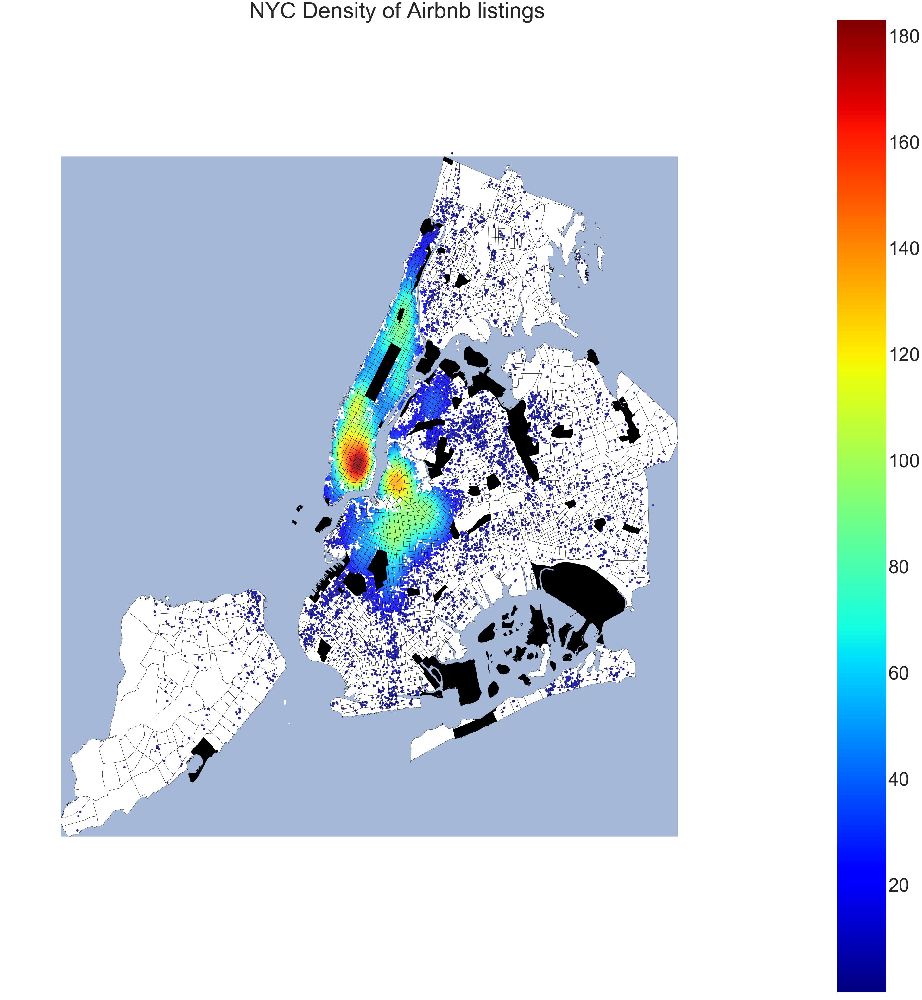

In [123]:
f, ax = plt.subplots(figsize=(55,55))
for polygon in un:
    patch = PolygonPatch(polygon, alpha=0.5, zorder=2)
    ax.add_patch(patch)
    
tracks[tracks['HD01_VD01']==0].plot(c = 'k', linewidth = .5, ax = ax, cmap=mycolor1, alpha=1)
tracks[tracks['HD01_VD01']>0].plot(c = 'k', linewidth = .5, ax = ax,  cmap = mycolor2, alpha=.15)
ax.scatter(x, y, c=z, s=50, edgecolor='', cmap=plt.cm.jet )
plt.axis('off')
plt.title("NYC Density of Airbnb listings ", size=70)

normalize = mcolors.Normalize(vmin=min(z),vmax=max(z))
colormap = cm.jet
scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(gdf.assign(cl = z))
cbar = plt.colorbar(scalarmappaple, ax=ax)
cbar.ax.tick_params(labelsize=60)
plt.show()

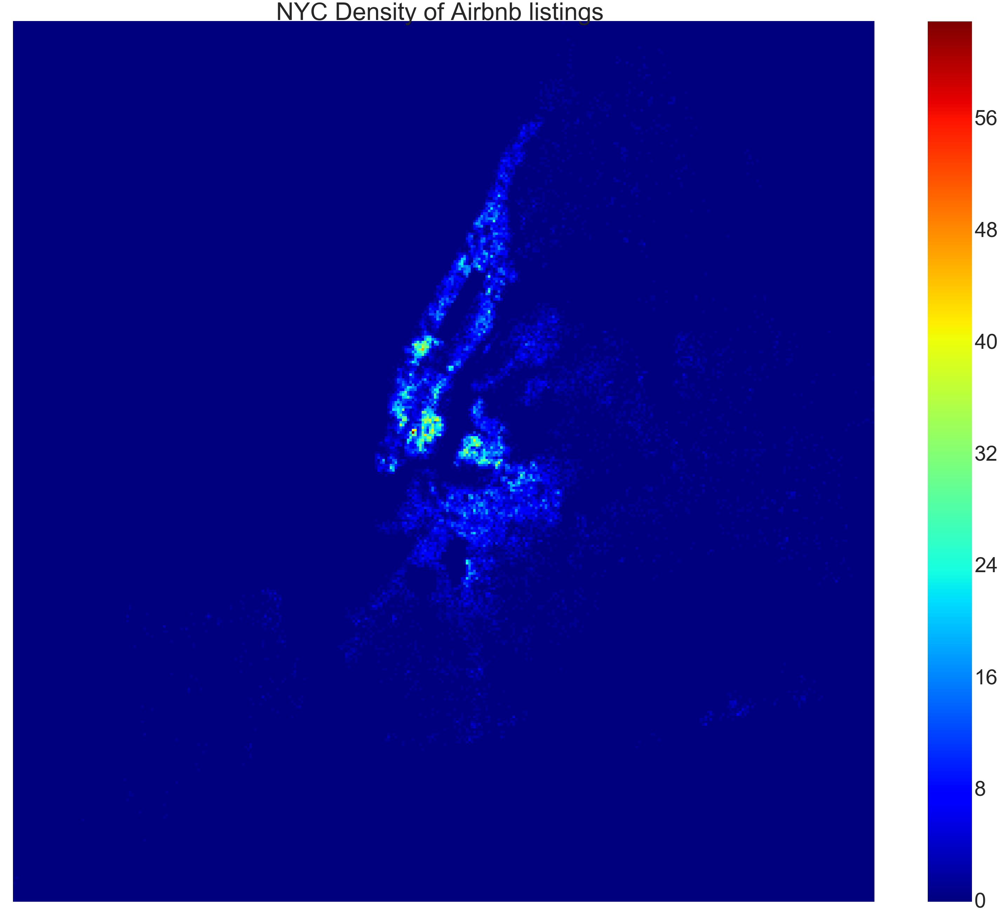

In [126]:
f, ax = plt.subplots(figsize=(55,45))
plt.axis('off')
plt.title("NYC Density of Airbnb listings ", size=70)
plt.hist2d(x, y, (350,350), cmap=plt.cm.jet)
#colorbar.ax.tick_params(labelsize=10) 
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=60)